In [1]:
import sccellfie

import scanpy as sc
import squidpy as sq

import pandas as pd
import numpy as np

import matplotlib.pyplot as plt

In [2]:
import mpl_fontkit as fk
fk.install("Lato")
fk.set_font("Lato")

Font name: `Lato`


In [3]:
import warnings
warnings.filterwarnings("ignore")

In [4]:
sc.settings.figdir = './Cancer-Figures/'

## Load Data

In [5]:
adata = sc.read_h5ad('/nfs/team292/eg22/Datasets/Endometrium-Carcinoma/Visium_GSE203612_Annotated.h5ad')

In [6]:
adata.obs.head()

,in_tissue,array_row,array_col,barkley2022_annotation
AAACAGAGCGACTCCT-1,1,14,94,Malignant
AAACCACTACACAGAT-1,1,3,117,Normal
AAACCCGAACGAAATC-1,1,45,115,Normal+Malignant
AAACGACAGTCTTGCC-1,1,2,118,Normal
AAACGCCCGAGATCGG-1,1,4,108,Normal+Malignant


In [7]:
annot = 'barkley2022_annotation'

In [8]:
SPOT_SIZE = 1.3

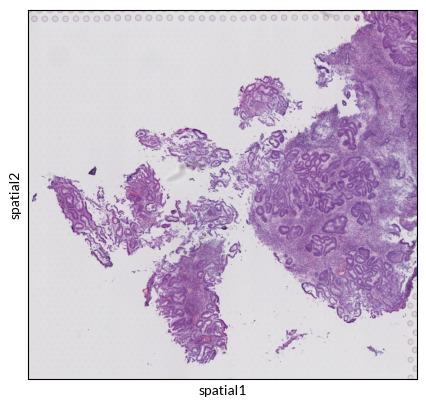

In [9]:
sc.pl.spatial(adata,
              img_key="hires",
              save='H&E'             
             )

## Preprocessing

In [10]:
bdata = adata.copy()
sc.pp.normalize_total(bdata, target_sum=1e4)
sc.pp.log1p(bdata)
adata.layers['log1p_10k'] = bdata.X.copy()

In [11]:
adata.obs['total_counts'] = adata.X.sum(axis=1)

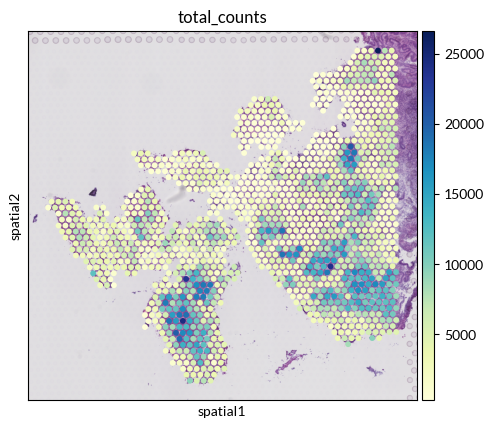

In [12]:
sc.pl.spatial(adata,
              color=['total_counts'],
              img_key="hires",
              cmap='YlGnBu',
              size=SPOT_SIZE,
              save='Total-Counts'
             )

## Identify cancer markers

In [13]:
tumorigenic_mkrs = ['S100A9', 'S100A8', 'LCN2', 'LTF', 'CXCL1', 'SAA1', 'SAA2']

In [14]:
sc.tl.score_genes(bdata, tumorigenic_mkrs, score_name='Tumorigenesis score') # Computed on processed data

<Axes: >

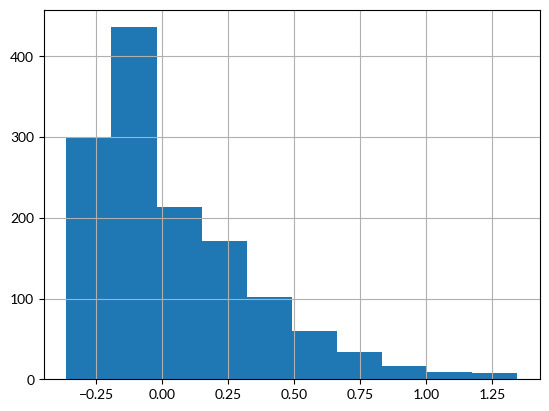

In [15]:
bdata.obs['Tumorigenesis score'].hist()

In [16]:
adata.obs['Tumorigenesis score'] = bdata.obs['Tumorigenesis score'] # Transfer scores back to original adata

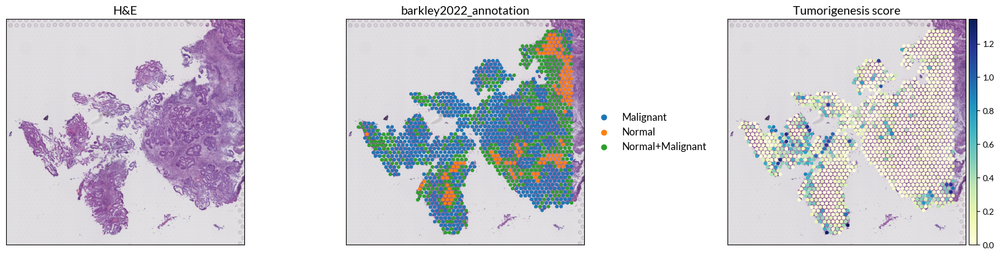

In [17]:
fig, axes = sccellfie.plotting.plot_spatial(adata,
                                            keys=[None, annot, 'Tumorigenesis score'],
                                            img_key="hires",
                                            cmap='YlGnBu',
                                            size=SPOT_SIZE ,
                                            use_raw=False, 
                                            ncols=3,
                                            vmin=0, 
                                            save='Cancer-Annot'             
                                            )

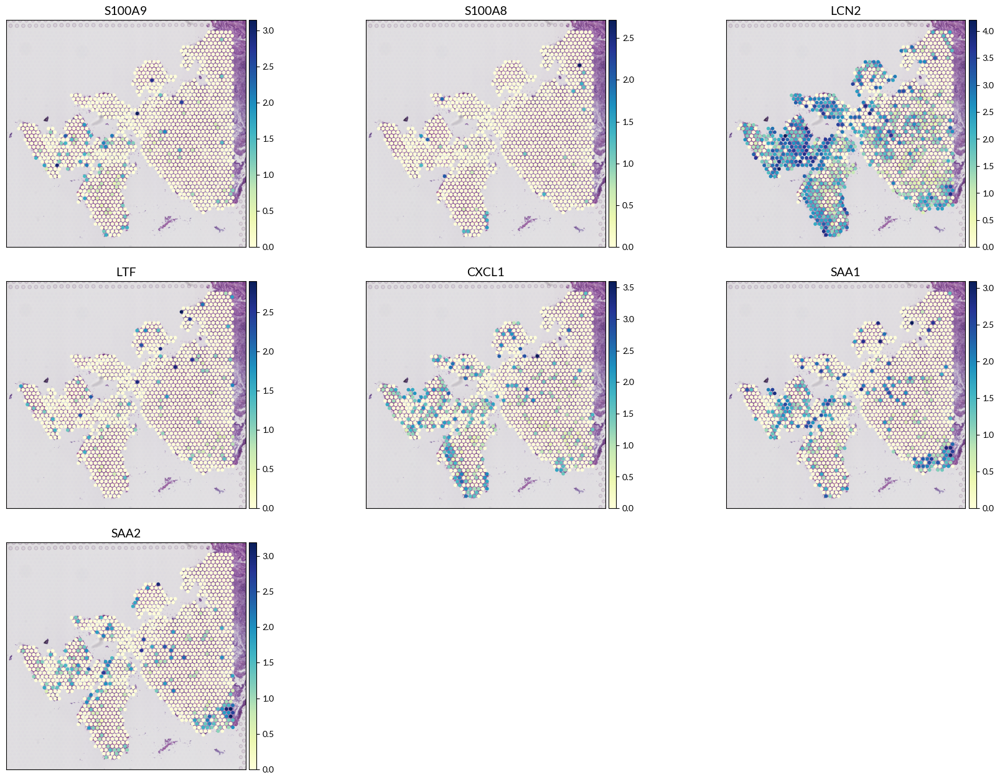

In [18]:
fig, axes = sccellfie.plotting.plot_spatial(adata,
                                            keys=[g for g in tumorigenic_mkrs if g in adata.var_names],
                                            img_key="hires",
                                            cmap='YlGnBu',
                                            size=SPOT_SIZE,
                                            use_raw=False, 
                                            ncols=3,
                                            vmin=0,
                                            layer='log1p_10k',
                                            save='Cancer-Tumorigenic-Markers'             
                                            )

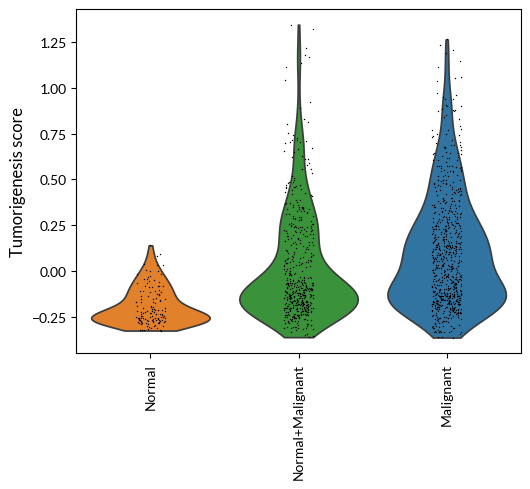

In [19]:
_ = sccellfie.plotting.create_multi_violin_plots(adata,
                                                 features=['Tumorigenesis score'],
                                                 groupby=annot,
                                                 order=['Normal', 'Normal+Malignant', 'Malignant'],
                                                 n_cols=2,
                                                 save='Tumorigenesis'
                                                )

## Run scCellFie

In [20]:
results = sccellfie.run_sccellfie_pipeline(adata, 
                                           organism='human',
                                           sccellfie_data_folder=None,
                                           n_counts_col='total_counts', 
                                           process_by_group=False, 
                                           groupby=None, 
                                           neighbors_key='neighbors',
                                           n_neighbors=10, 
                                           batch_key=None, 
                                           threshold_key='sccellfie_threshold', 
                                           smooth_cells=True,
                                           alpha=0.33,
                                           chunk_size=5000,
                                           disable_pbar=False, 
                                           save_folder=None,
                                           save_filename=None
                                          )


==== scCellFie Pipeline: Initializing ====
Loading scCellFie database for organism: human

==== scCellFie Pipeline: Processing entire dataset ====

---- scCellFie Step: Preprocessing data ----

---- scCellFie Step: Computing neighbors ----


2025-03-20 22:02:46.915549: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1742508166.933721    1646 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1742508166.939400    1646 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-03-20 22:02:46.961706: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.



---- scCellFie Step: Preparing inputs ----
Gene names corrected to match database: 22
Shape of new adata object: (1351, 929)
Number of GPRs: 787
Shape of tasks by genes: (218, 929)
Shape of reactions by genes: (787, 929)
Shape of tasks by reactions: (218, 787)

---- scCellFie Step: Smoothing gene expression ----


Smoothing Expression: 100%|██████████| 1/1 [00:00<00:00, 14.10it/s]



---- scCellFie Step: Computing gene scores ----

---- scCellFie Step: Computing reaction activity ----


Cell Rxn Activities: 100%|██████████| 1351/1351 [00:07<00:00, 182.06it/s]



---- scCellFie Step: Computing metabolic task activity ----
Removed 1 metabolic tasks with zeros across all cells.

==== scCellFie Pipeline: Processing completed successfully ====


## Identify metabolic markers

*Run TF-IDF*

In [21]:
mrks = sccellfie.external.quick_markers(results['adata'].metabolic_tasks,
                                        cluster_key=annot, 
                                        n_markers=20, 
                                        express_cut=5*np.log(2) # Considered as active task (5*log(1 + Expression/Threshold)); means expression is at least the threshold
                                       )

*TF-IDF filtering*

<Axes: >

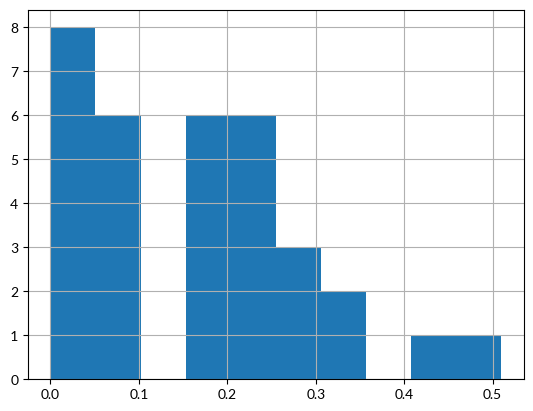

In [22]:
mrks['tf_idf'].hist()

Text(0, 0.5, 'IDF')

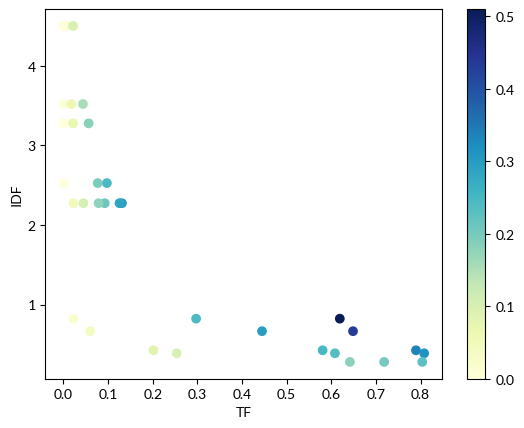

In [23]:
scatter = plt.scatter(mrks['tf'], mrks['idf'], c=mrks['tf_idf'], cmap='YlGnBu')
plt.colorbar(scatter)
plt.xlabel('TF')
plt.ylabel('IDF')

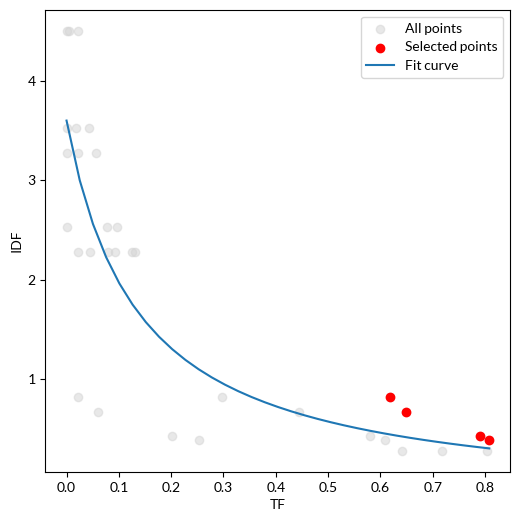

In [24]:
# Fits a hyperbolic curve and filters based on thresholds

x_col = 'tf'
y_col = 'idf'
df = mrks
tfidf_threshold = 0.3
tf_ratio = 1.2

# Visualization
plt.figure(figsize=(6, 6))

# Plot all points
plt.scatter(df[x_col], df[y_col], alpha=0.5, c='lightgray', label='All points')

# Plot selected points
filtered_mrks, curve = sccellfie.external.filter_tfidf_markers(df, tf_col=x_col, idf_col=y_col, tfidf_threshold=tfidf_threshold, tf_ratio=tf_ratio)

plt.scatter(filtered_mrks[x_col], filtered_mrks[y_col], c='red', label='Selected points')
plt.plot(*curve, label='Fit curve')

plt.xlabel('TF')
plt.ylabel('IDF')
plt.legend()

In [25]:
tfidf_markers = filtered_mrks['gene'].unique().tolist()

In [26]:
tfidf_markers

['Mevalonate synthesis',
 'Glucose to lactate conversion',
 'ATP generation from glucose (hypoxic conditions) - glycolysis',
 'Conversion of carnosine to beta-alanine']

*Scanpy Logistic Regression*

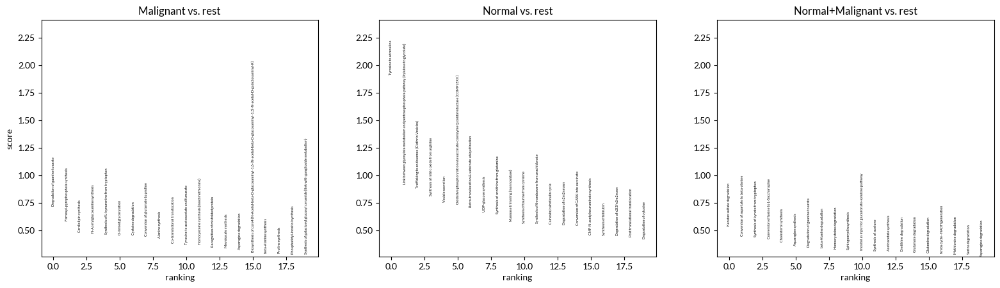

In [27]:
method = 'logreg'
sc.tl.rank_genes_groups(results['adata'].metabolic_tasks, groupby=annot, 
                        method=method,
                        use_raw=False,
                        key_added=method)

sc.pl.rank_genes_groups(results['adata'].metabolic_tasks, n_genes=20, sharey=True, key=method, fontsize=4)

In [28]:
scanpy_df = sc.get.rank_genes_groups_df(results['adata'].metabolic_tasks, 
                                        key=method, 
                                        group=None) 

*Score-based filtering*

<Axes: >

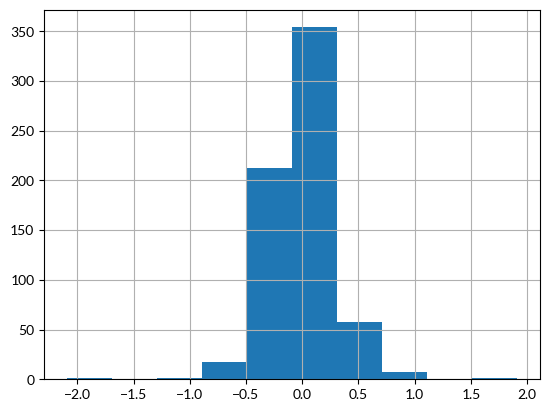

In [29]:
scanpy_df['scores'].hist()

In [30]:
sc_markers_df = scanpy_df
scanpy_markers = sc_markers_df.loc[sc_markers_df['scores'] > 1.5]['names'].unique().tolist()
len(scanpy_markers)

1

**Combining TF-IDF & Logistic Regresion Markers**

In [31]:
both_markers = sorted(set(tfidf_markers).union(set(scanpy_markers)))

In [32]:
# Consider only metabolic tasks with a prudent score at the cell type level (>1)
agg = sccellfie.expression.aggregation.agg_expression_cells(results['adata'].metabolic_tasks[:, both_markers], 
                                                            annot, 
                                                            agg_func='trimean')
agg = agg.T.loc[(agg.T > 1.).any(axis=1)]

In [33]:
both_markers = agg.index.tolist()

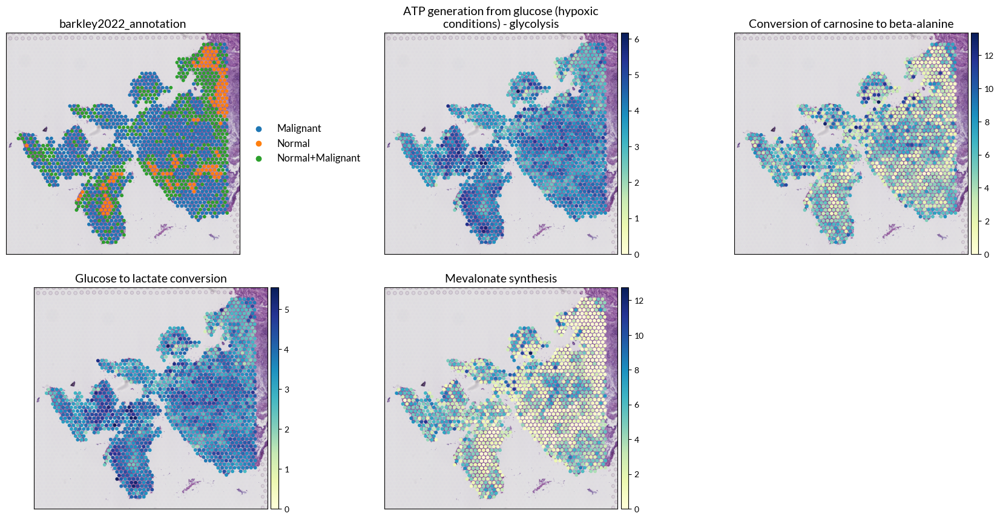

In [34]:
fig, axes = sccellfie.plotting.plot_spatial(results['adata'].metabolic_tasks,
                                            keys=[annot] + both_markers, 
                                            img_key="hires",
                                            cmap='YlGnBu',
                                            size=SPOT_SIZE,
                                            use_raw=False, 
                                            ncols=3,
                                            vmin=0,
                                            save='Cancer-scCellFie-Markers'             
                                            )

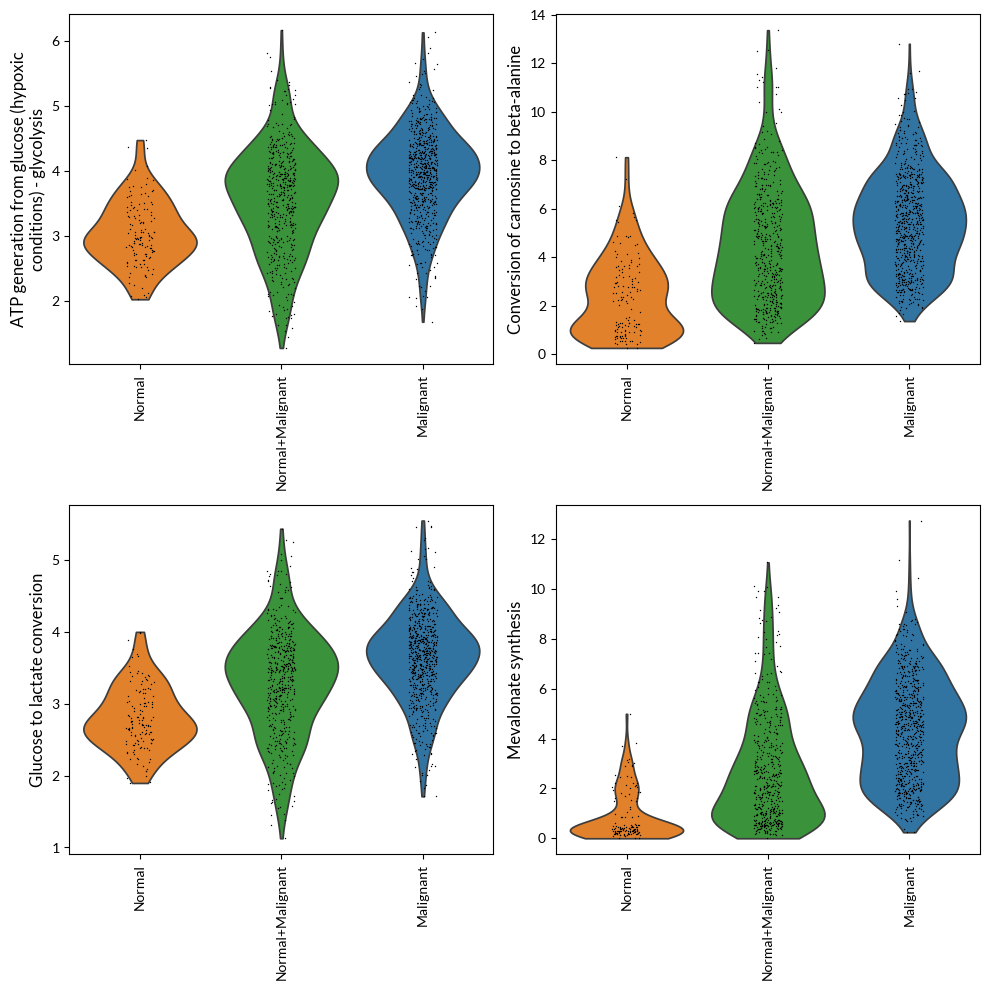

In [35]:
_ = sccellfie.plotting.create_multi_violin_plots(results['adata'].metabolic_tasks,
                                                 features=both_markers,
                                                 groupby=annot,
                                                 order=['Normal', 'Normal+Malignant', 'Malignant'],
                                                 n_cols=2,
                                                 save='Cancer-Markers-Dist'
                                                )

## Spatial Metrics

### Generate spatial knn network

In [36]:
sccellfie.spatial.create_knn_network(results['adata'].metabolic_tasks, n_neighbors=10, spatial_key='spatial')

In [37]:
sccellfie.spatial.create_knn_network(adata, n_neighbors=10, spatial_key='spatial')

### Moran's I

In [38]:
import squidpy as sq

In [39]:
sq.gr.spatial_autocorr(
    results['adata'].metabolic_tasks,
    mode="moran",
    n_perms=1000,
    n_jobs=1,
)

  0%|          | 0/1000 [00:00<?, ?/s]

In [40]:
moran = results['adata'].metabolic_tasks.uns['moranI']

In [41]:
moran

,I,pval_norm,var_norm,pval_z_sim,pval_sim,var_sim,pval_norm_fdr_bh,pval_z_sim_fdr_bh,pval_sim_fdr_bh
Asparagine degradation,0.501735,0.000000,0.000281,0.000000,0.000999,0.000407,0.000000,0.000000,0.001239
Lysine degradation,0.499630,0.000000,0.000281,0.000000,0.000999,0.000399,0.000000,0.000000,0.001239
Tryptophan degradation,0.498825,0.000000,0.000281,0.000000,0.000999,0.000391,0.000000,0.000000,0.001239
Palmitolate synthesis,0.488031,0.000000,0.000281,0.000000,0.000999,0.000393,0.000000,0.000000,0.001239
Threonine degradation,0.475709,0.000000,0.000281,0.000000,0.000999,0.000374,0.000000,0.000000,0.001239
...,...,...,...,...,...,...,...,...,...
Homocysteine degradation,0.001859,0.438388,0.000281,0.434345,0.307692,0.000134,0.444534,0.440434,0.312006
GPI-anchor,0.001243,0.452903,0.000281,0.465443,0.448551,0.000131,0.457116,0.465443,0.450628
Glycerol-3-phosphate synthesis,-0.001442,0.483309,0.000281,0.438629,0.372627,0.000167,0.483309,0.442709,0.376094
Malate to pyruvate conversion,-0.001498,0.481980,0.000281,0.464317,0.473526,0.000158,0.483309,0.465443,0.473526


**Visualize spatially informative variables (High Moran's I coefficient)**

<Axes: >

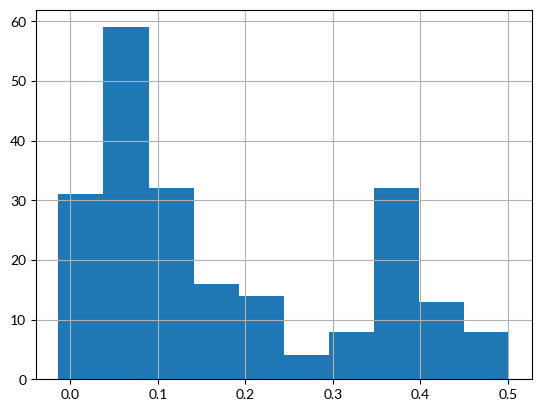

In [42]:
moran['I'].hist()

In [43]:
coef_threshold = 0.3

In [44]:
top_moran = moran[moran['I'].abs() >= coef_threshold].dropna().sort_values(by='I', ascending=False)

In [45]:
top_moran

,I,pval_norm,var_norm,pval_z_sim,pval_sim,var_sim,pval_norm_fdr_bh,pval_z_sim_fdr_bh,pval_sim_fdr_bh
Asparagine degradation,0.501735,0.0,0.000281,0.0,0.000999,0.000407,0.0,0.0,0.001239
Lysine degradation,0.499630,0.0,0.000281,0.0,0.000999,0.000399,0.0,0.0,0.001239
Tryptophan degradation,0.498825,0.0,0.000281,0.0,0.000999,0.000391,0.0,0.0,0.001239
Palmitolate synthesis,0.488031,0.0,0.000281,0.0,0.000999,0.000393,0.0,0.0,0.001239
Threonine degradation,0.475709,0.0,0.000281,0.0,0.000999,0.000374,0.0,0.0,0.001239
...,...,...,...,...,...,...,...,...,...
Phosphatidyl-inositol synthesis,0.316713,0.0,0.000281,0.0,0.000999,0.000294,0.0,0.0,0.001239
Tyrosine to adrenaline,0.316060,0.0,0.000281,0.0,0.000999,0.000299,0.0,0.0,0.001239
Synthesis of globoside (link with globoside metabolism),0.309968,0.0,0.000281,0.0,0.000999,0.000341,0.0,0.0,0.001239
Oxidative phosphorylation via succinate-coenzyme Q oxidoreductase (COMPLEX II),0.304752,0.0,0.000281,0.0,0.000999,0.000268,0.0,0.0,0.001239


In [46]:
spa_informative_var = list(top_moran.index)

In [47]:
# Top morans that are over their threshold in at least one Visium spot
mt_df = results['adata'].metabolic_tasks.to_df().max(axis=0)
spa_informative_var = list(mt_df[spa_informative_var][mt_df[spa_informative_var] > 5*np.log(2)].index)

In [48]:
spa_informative_var

['Hydroxymethylglutaryl-CoA synthesis',
 'Aspartate synthesis',
 'Alanine synthesis',
 'Synthesis of acetone',
 'Acetoacetate synthesis',
 'Proline synthesis',
 'Glutamate synthesis',
 'Gluconeogenesis from Lactate',
 'Glucose to lactate conversion',
 '(R)-3-Hydroxybutanoate synthesis',
 'Glutamine synthesis',
 'Mevalonate synthesis',
 'ATP generation from glucose (hypoxic conditions) - glycolysis',
 'Serine synthesis',
 'Glycine synthesis',
 'Oxidative phosphorylation via succinate-coenzyme Q oxidoreductase (COMPLEX II)']

In [49]:
spa_inf_titles = [t + " (Moran's I: {:.3f})".format(top_moran.loc[t, 'I']) for t in spa_informative_var ]

In [50]:
spa_inf_titles

["Hydroxymethylglutaryl-CoA synthesis (Moran's I: 0.392)",
 "Aspartate synthesis (Moran's I: 0.391)",
 "Alanine synthesis (Moran's I: 0.390)",
 "Synthesis of acetone (Moran's I: 0.387)",
 "Acetoacetate synthesis (Moran's I: 0.387)",
 "Proline synthesis (Moran's I: 0.386)",
 "Glutamate synthesis (Moran's I: 0.385)",
 "Gluconeogenesis from Lactate (Moran's I: 0.384)",
 "Glucose to lactate conversion (Moran's I: 0.379)",
 "(R)-3-Hydroxybutanoate synthesis (Moran's I: 0.378)",
 "Glutamine synthesis (Moran's I: 0.378)",
 "Mevalonate synthesis (Moran's I: 0.378)",
 "ATP generation from glucose (hypoxic conditions) - glycolysis (Moran's I: 0.374)",
 "Serine synthesis (Moran's I: 0.358)",
 "Glycine synthesis (Moran's I: 0.356)",
 "Oxidative phosphorylation via succinate-coenzyme Q oxidoreductase (COMPLEX II) (Moran's I: 0.305)"]

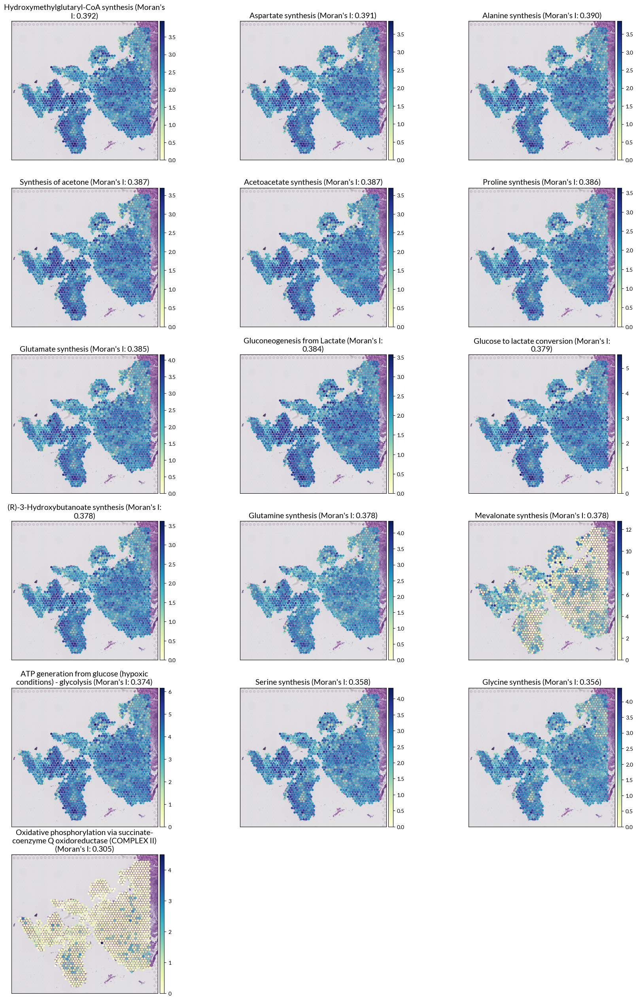

In [51]:
fig, axes = sccellfie.plotting.plot_spatial(results['adata'].metabolic_tasks,
                                            keys=spa_informative_var, 
                                            img_key="hires",
                                            cmap='YlGnBu',
                                            size=SPOT_SIZE,
                                            use_raw=False, 
                                            ncols=3,
                                            vmin=0,
                                            save='Moran_I',
                                            hspace=0.2,
                                            title=spa_inf_titles
                                            )

## Correlating metabolic activities with tumorigenesis score

In [52]:
corr = sccellfie.preprocessing.matrix_utils.compute_dataframes_correlation(adata.obs[['Tumorigenesis score']],
                                                                           results['adata'].metabolic_tasks.to_df(),
                                                                           method='pearson')

array([[<Axes: title={'center': 'Tumorigenesis score'}>]], dtype=object)

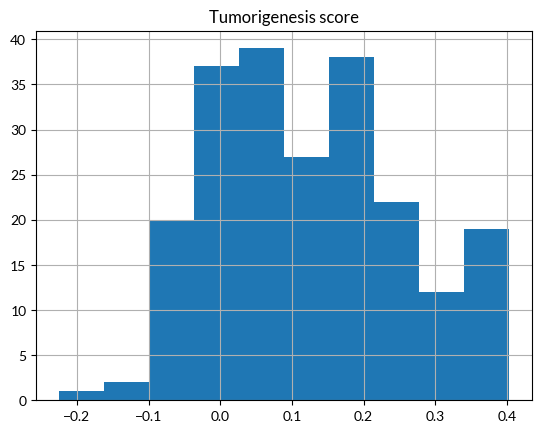

In [53]:
corr.hist()

*Identify highly correlated (|Pearson|>0.4)*

In [54]:
high_corr = [f'{idx}' for idx, row in corr[corr['Tumorigenesis score'].abs() > 0.4].iterrows()]
high_title = ['{} (Pearson: {:.3f})'.format(idx, row['Tumorigenesis score']) for idx, row in corr[corr['Tumorigenesis score'].abs() > 0.4].iterrows()]

In [55]:
high_corr

['Synthesis of N-formylanthranilate from tryptophan']

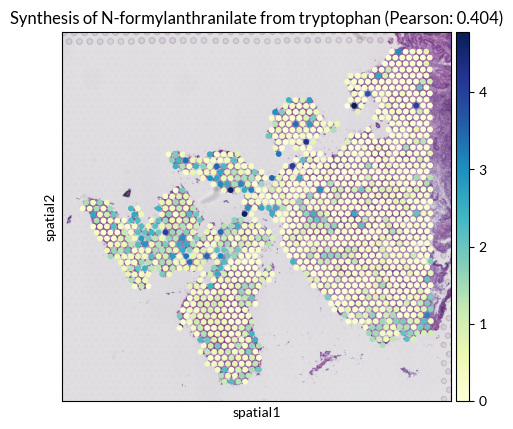

In [56]:
sc.pl.spatial(results['adata'].metabolic_tasks, 
              img_key="hires", 
              color=high_corr, 
              title=high_title,
              use_raw=False,
              cmap='YlGnBu',
              save='High_Corr', 
              size=SPOT_SIZE)

In [57]:
corr.loc[high_corr, :]

,Tumorigenesis score
Column,
Synthesis of N-formylanthranilate from tryptophan,0.403541


## Cell-cell communication

In [58]:
r = sccellfie.spatial.compute_neighbor_distribution(
    adata,
    radius_range=(0, 1000),  # adjust based on your data's scale
    n_points=200,
    spatial_key='spatial'
)

(<Figure size 1500x800 with 4 Axes>, GridSpec(2, 3))

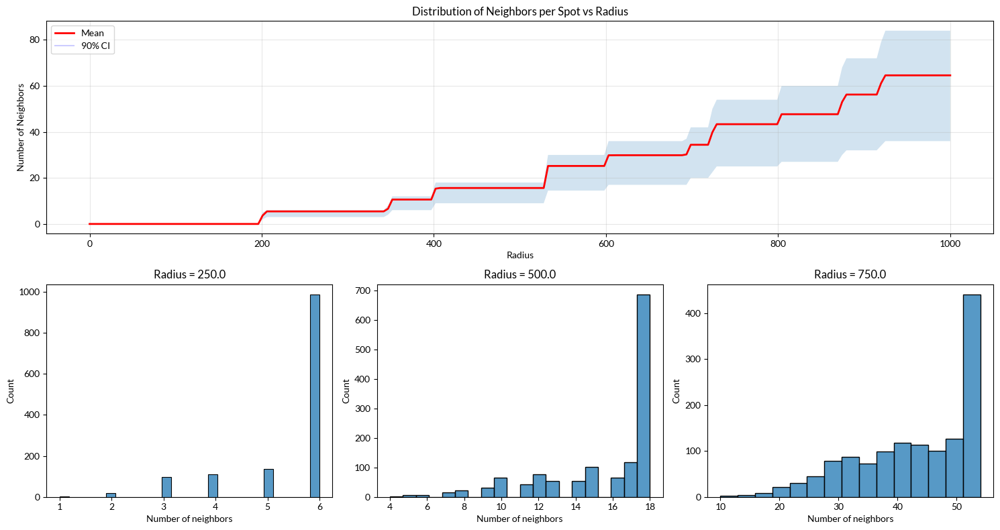

In [59]:
sccellfie.plotting.spatial.plot_neighbor_distribution(r, save='CCC-Radius')

Selected radius here is 250, minimum could be about ~200-210 to keep mode of neighbors (in distribution) of ~6

In [60]:
radius = 250

**Visualize metabolic tasks related to estrogen production**

In [61]:
estrogen = ['Synthesis of androstenedione from cholesterol',
            'Synthesis of estrone (E1) from androstenedione',
            'Conversion of estrone (E1) to estradiol-17beta (E2)',
            'Synthesis of estradiol-17beta (E2) from androstenedione',
            ]

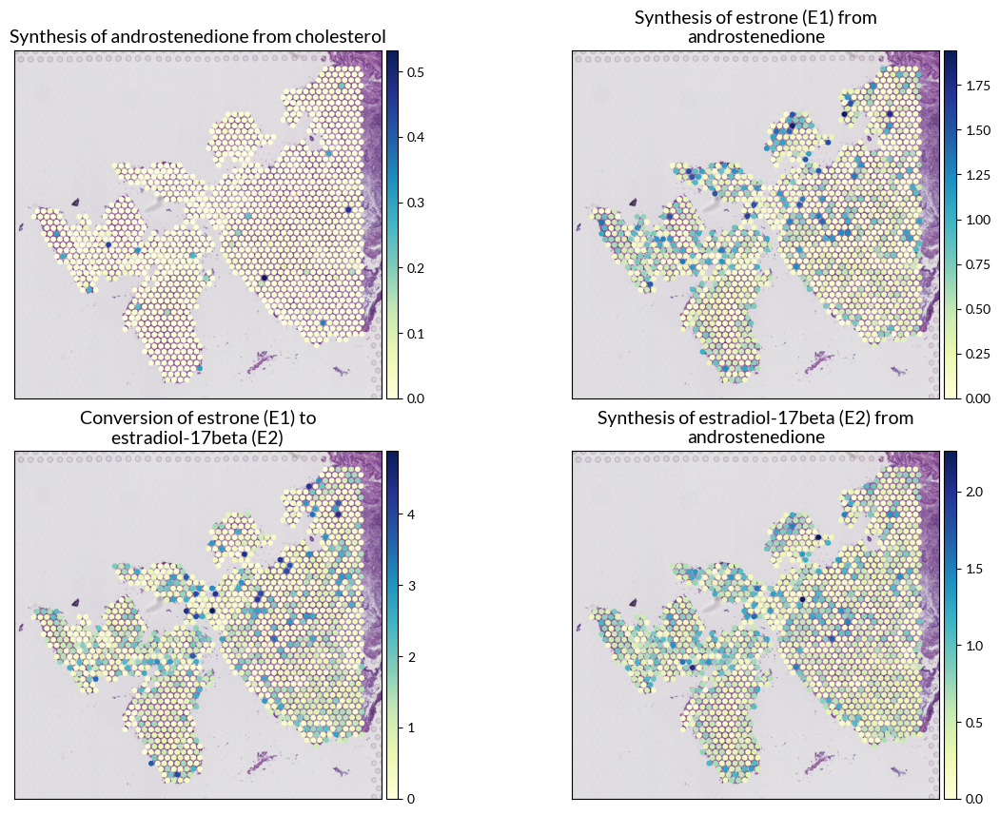

In [62]:
fig, axes = sccellfie.plotting.plot_spatial(results['adata'].metabolic_tasks,
                                            keys=estrogen , 
                                            img_key="hires",
                                            cmap='YlGnBu',
                                            size=SPOT_SIZE,
                                            use_raw=False, 
                                            ncols=2,
                                            vmin=0,
                                            save='Estrogen-Tasks'             
                                            )

### Transfer metabolic tasks into gene expression (all variables in one AnnData object)

In [63]:
adata_updated = sccellfie.preprocessing.adata_utils.transfer_variables(
    adata_target=bdata,
    adata_source=results['adata'].metabolic_tasks,
    var_names=results['adata'].metabolic_tasks.var_names
)

In [64]:
adata_updated

AnnData object with n_obs × n_vars = 1351 × 33755
    obs: 'in_tissue', 'array_row', 'array_col', 'barkley2022_annotation', 'Tumorigenesis score'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'spatial', 'log1p'
    obsm: 'spatial', 'X_pca', 'X_umap'
    obsp: 'distances', 'connectivities', 'spatial_connectivities', 'spatial_distances'

### Compute cell-cell communication based on synthesis and receptor pairs

In [65]:
# Compute local colocalization scores for estradiol + ESR1
adata_updated.obs['E2^ESR1'] = sccellfie.communication.compute_local_colocalization_scores(
    adata_updated,
    var1='Synthesis of estradiol-17beta (E2) from androstenedione',
    var2='ESR1',
    neighbors_radius=radius,
    method='pairwise_concordance',
    min_neighbors=3,
    spatial_key='spatial',
    inplace=False
)

In [66]:
# Compute local colocalization scores for kynurenine + AHR
adata_updated.obs['L-kynurenine^AHR'] = sccellfie.communication.compute_local_colocalization_scores(
    adata_updated,
    var1='Synthesis of L-kynurenine from tryptophan',
    var2='AHR',
    neighbors_radius=radius,
    method='pairwise_concordance',
    min_neighbors=3,
    spatial_key='spatial',
    inplace=False
)

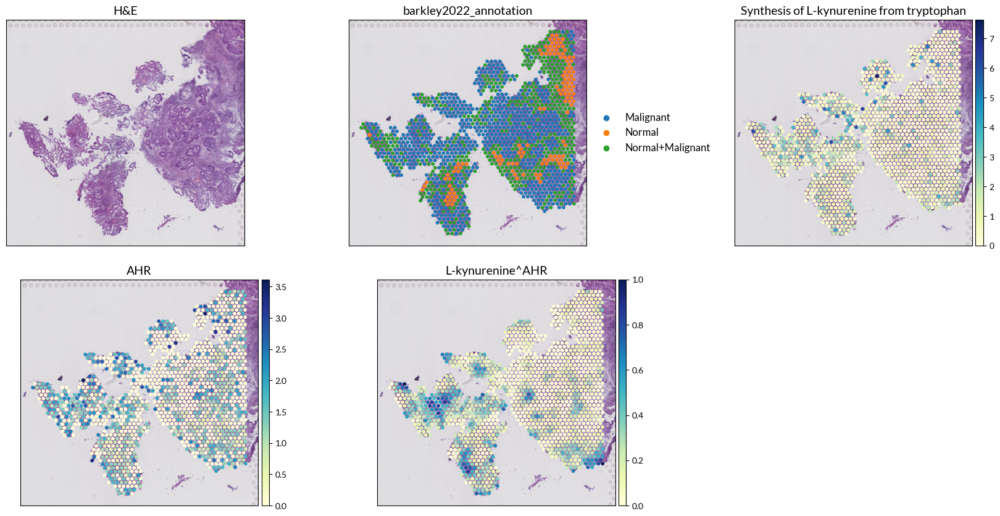

In [67]:
fig, axes = sccellfie.plotting.plot_spatial(adata_updated,
                                            keys=[None,  annot,
                                                  'Synthesis of L-kynurenine from tryptophan', 'AHR', 'L-kynurenine^AHR'],
                                            img_key="hires",
                                            cmap='YlGnBu',
                                            size=SPOT_SIZE,
                                            use_raw=False, 
                                            ncols=3,
                                            vmin=0,
                                            hspace=0.15,
                                            save='CCC_kynurenine^AHR'            
                                            )

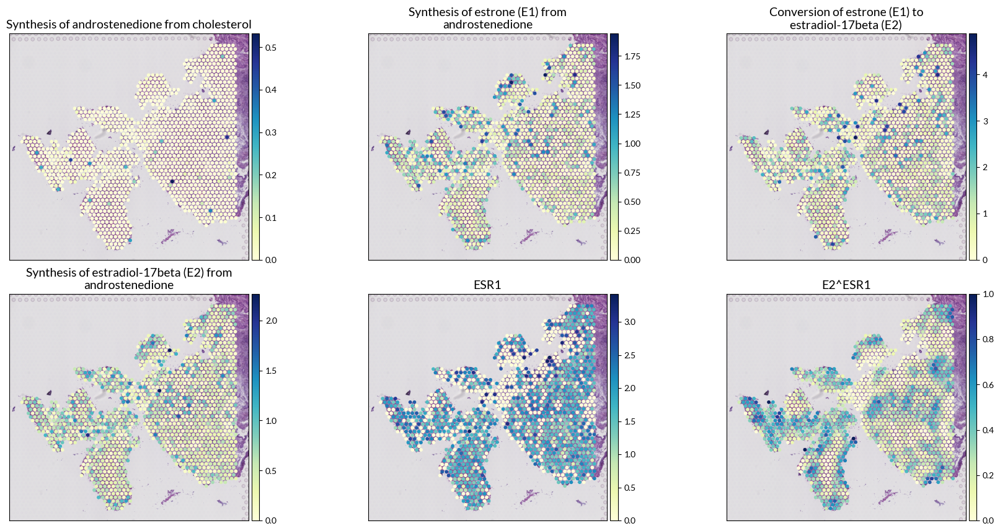

In [68]:
fig, axes = sccellfie.plotting.plot_spatial(adata_updated,
                                            keys=estrogen + ['ESR1', 'E2^ESR1'],
                                            img_key="hires",
                                            cmap='YlGnBu',
                                            size=SPOT_SIZE,
                                            use_raw=False, 
                                            ncols=3,
                                            vmin=0,
                                            save='Estrogen'            
                                            )

## Final Visualizations (por publication)

(<Figure size 1408x480 with 2 Axes>,
 [<Axes: title={'center': 'H&E'}>,
  <Axes: title={'center': 'barkley2022_annotation'}>])

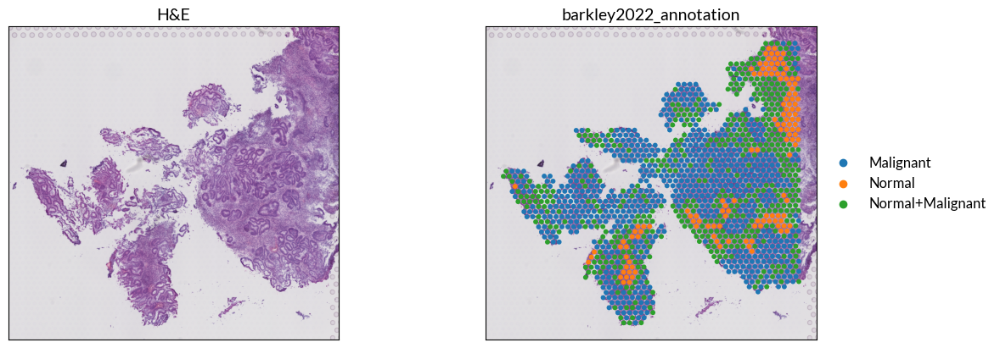

In [69]:
sccellfie.plotting.plot_spatial(adata_updated,
                                keys=[None, annot], 
                                suptitle=None,
                                bkgd_label='H&E',
                                ncols=2,
                                cmap='YlGnBu', 
                                size=SPOT_SIZE,
                                save='Cancer-H&E-Annot',
                                dpi=300, 
                                bbox_inches='tight'
                               )

In [70]:
final_order = ['Glucose to lactate conversion', 'Mevalonate synthesis', 'E2^ESR1',
               'Tumorigenesis score', 'Synthesis of N-formylanthranilate from tryptophan', 'L-kynurenine^AHR'
              ]
final_labels = ["Glucose to lactate conversion (Moran's I: 0.379)", 'Mevalonate synthesis', 'Communication: E2 & ESR1',
                "Tumorigenesis score", high_title[0], 'Communication: L-kynurenine & AHR']

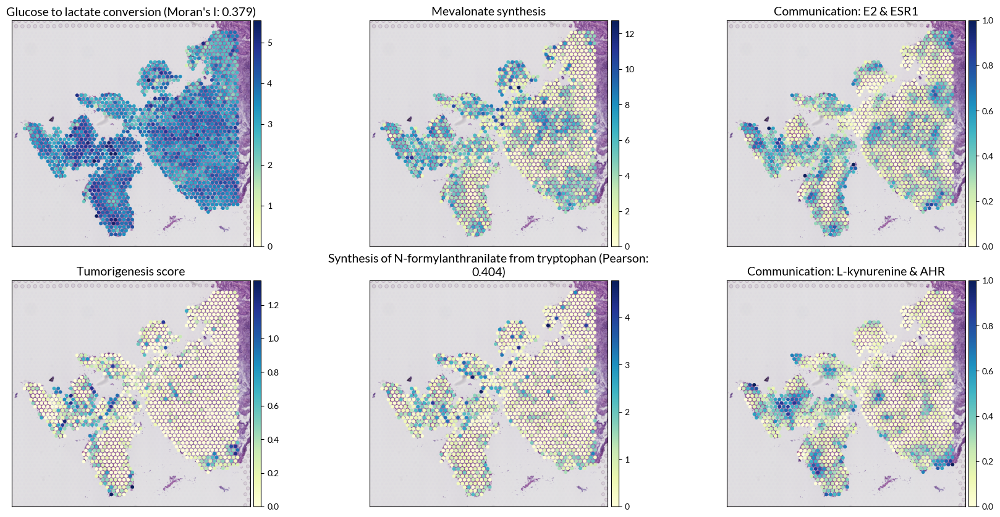

In [71]:
fig, axes = sccellfie.plotting.plot_spatial(adata_updated,
                                            keys=final_order,
                                            title=final_labels,
                                            img_key="hires",
                                            cmap='YlGnBu',
                                            size=SPOT_SIZE,
                                            use_raw=False, 
                                            ncols=3,
                                            vmin=0,
                                            wrapped_title_length=60,
                                            save='Cancer-Paper-Fig'             
                                           )

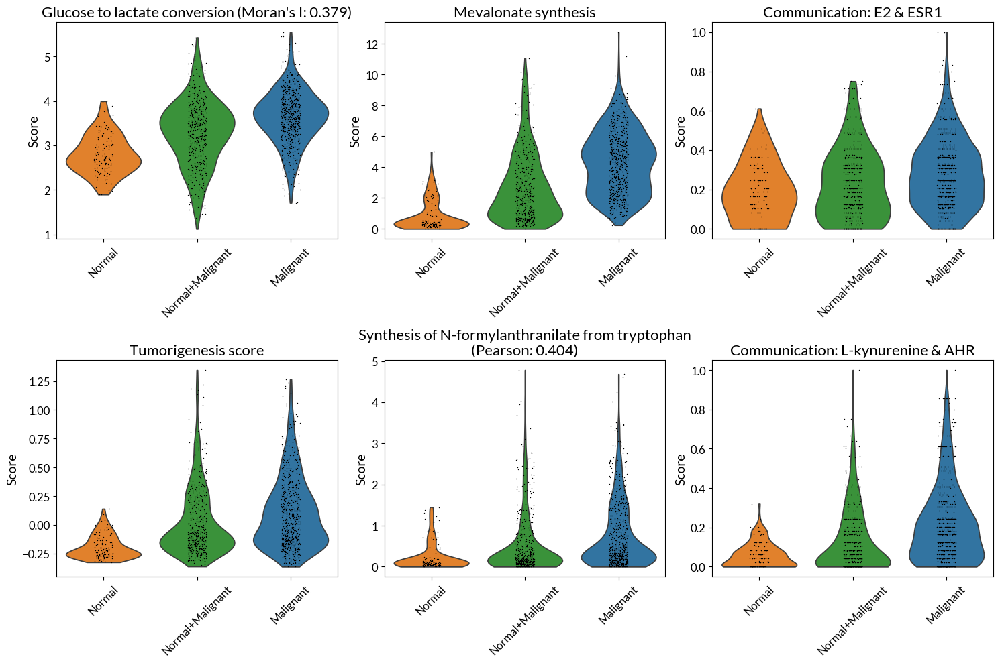

In [72]:
_ = sccellfie.plotting.create_multi_violin_plots(adata_updated, 
                                                 features=final_order,
                                                 title=final_labels,
                                                 groupby=annot,
                                                 order=['Normal', 'Normal+Malignant', 'Malignant'],
                                                 n_cols=3,
                                                 save='Cancer-Paper-Fig',
                                                 xlabel=None,
                                                 ylabel='Score',
                                                 wrapped_title_length=55,
                                                 fontsize=12, rotation=45
                                                )

### Statistical tests

In [73]:
# Run pairwise tests
results_df = sccellfie.stats.pairwise_differential_analysis(adata_updated,
                                                            var_names=final_order,
                                                            groupby='barkley2022_annotation',
                                                            order=['Normal', 'Normal+Malignant', 'Malignant'])


Processing features: 100%|██████████| 6/6 [00:00<00:00, 135.38it/s]


In [74]:
results_df['is_significant'] = results_df['adj_p_value'] < 0.01

In [75]:
results_df

,feature,group1,group2,log2FC,test_statistic,p_value,cohens_d,n_group1,n_group2,median_group1,median_group2,median_diff,adj_p_value,is_significant
0,Glucose to lactate conversion,Normal,Normal+Malignant,0.235297,8.071841,6.924618e-16,0.718114,134,508,2.723516,3.370434,0.646917,1.133119e-15,True
1,Glucose to lactate conversion,Normal,Malignant,0.378225,13.441917,3.434249e-41,1.427476,134,709,2.723516,3.672077,0.948560,2.060550e-40,True
2,Glucose to lactate conversion,Normal+Malignant,Malignant,0.142928,8.407985,4.171151e-17,0.513165,508,709,3.370434,3.672077,0.301643,8.342302e-17,True
3,Mevalonate synthesis,Normal,Normal+Malignant,1.632060,11.282303,1.604881e-29,0.897796,134,508,0.388894,2.115907,1.727012,5.777572e-29,True
4,Mevalonate synthesis,Normal,Malignant,2.300855,16.268638,1.647826e-59,1.796679,134,709,0.388894,4.367264,3.978370,2.966087e-58,True
5,Mevalonate synthesis,Normal+Malignant,Malignant,0.668795,13.525680,1.103187e-41,0.751808,508,709,2.115907,4.367264,2.251358,9.928680e-41,True
6,E2^ESR1,Normal,Normal+Malignant,0.273412,1.962775,4.967233e-02,0.232068,134,507,0.175170,0.204082,0.028912,4.967233e-02,False
7,E2^ESR1,Normal,Malignant,0.553553,5.315335,1.064615e-07,0.515685,134,709,0.175170,0.244898,0.069728,1.368790e-07,True
8,E2^ESR1,Normal+Malignant,Malignant,0.280141,5.041453,4.620095e-07,0.277959,507,709,0.204082,0.244898,0.040816,5.197607e-07,True
9,Tumorigenesis score,Normal,Normal+Malignant,0.000000,9.478758,2.573277e-21,0.795053,134,508,-0.223611,-0.090066,0.133545,6.616998e-21,True


In [76]:
results_df.to_csv(str(sc.settings.figdir) + '/Paper-Supp-Stats.csv', index=False)